In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
!pip install ultralytics

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 646.6/646.6 kB 8.9 MB/s eta 0:00:00


In [3]:
!pip install fiftyone
!pip install fiftyone-db-ubuntu2204

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 58.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 41.7/41.7 kB 5.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 139.3/139.3 kB 19.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 53.4/53.4 kB 8.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 57.8/57.8 kB 9.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 79.9/79.9 MB 8.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 108.9/108.9 kB 17.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.6/70.6 kB 11.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 677.1/677.1 kB 67.0 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 70.1/70.1 kB 11.8 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 192.5/192.5 kB 26.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.3/78.3 kB 10.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━

In [4]:
# import zipfile
# import requests
import cv2
import matplotlib.pyplot as plt
import glob
import random
import os
from ultralytics import YOLO

In [5]:
# import fiftyone as fo
# print(fo.config)

In [6]:
import fiftyone as fo
import fiftyone.zoo as foz

# change where zoo datasets are downloaded
# NOTE: dataset disimpan dalam folder "/content/datasets"
# agar sesuai dengan default setting dataset ultralytics
fo.config.dataset_zoo_dir = "/content/datasets"

# Load the COCO-2017 dataset
# This will download it from the FiftyOne Dataset Zoo if necessary
dataset = foz.load_zoo_dataset("coco-2017", split="train", label_types=["detections"], classes=["person"], max_samples=3000)
dataset_test = foz.load_zoo_dataset("coco-2017", split="validation", label_types=["detections"], classes=["person"], max_samples=500)

# Print summary information about the view
print(dataset)

Migrating database to v0.22.3


INFO:fiftyone.migrations.runner:Migrating database to v0.22.3


INFO:fiftyone.zoo.datasets:Downloading split 'train' to '/content/datasets/coco-2017/train' if necessary


INFO:fiftyone.utils.coco:Downloading annotations to '/content/datasets/coco-2017/tmp-download/annotations_trainval2017.zip'


 100% |██████|    1.9Gb/1.9Gb [26.5s elapsed, 0s remaining, 82.9Mb/s]      


INFO:eta.core.utils: 100% |██████|    1.9Gb/1.9Gb [26.5s elapsed, 0s remaining, 82.9Mb/s]      


Extracting annotations to '/content/datasets/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Extracting annotations to '/content/datasets/coco-2017/raw/instances_train2017.json'


INFO:fiftyone.utils.coco:Downloading 3000 images


 100% |████████████████| 3000/3000 [31.0m elapsed, 0s remaining, 1.6 images/s]      


INFO:eta.core.utils: 100% |████████████████| 3000/3000 [31.0m elapsed, 0s remaining, 1.6 images/s]      


Writing annotations for 3000 downloaded samples to '/content/datasets/coco-2017/train/labels.json'


INFO:fiftyone.utils.coco:Writing annotations for 3000 downloaded samples to '/content/datasets/coco-2017/train/labels.json'


Dataset info written to '/content/datasets/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/content/datasets/coco-2017/info.json'


Loading 'coco-2017' split 'train'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'train'


 100% |███████████████| 3000/3000 [23.1s elapsed, 0s remaining, 90.7 samples/s]       


INFO:eta.core.utils: 100% |███████████████| 3000/3000 [23.1s elapsed, 0s remaining, 90.7 samples/s]       


Dataset 'coco-2017-train-3000' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-train-3000' created


INFO:fiftyone.zoo.datasets:Downloading split 'validation' to '/content/datasets/coco-2017/validation' if necessary


Found annotations at '/content/datasets/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Found annotations at '/content/datasets/coco-2017/raw/instances_val2017.json'


INFO:fiftyone.utils.coco:Downloading 500 images


 100% |██████████████████| 500/500 [5.2m elapsed, 0s remaining, 1.6 images/s]    


INFO:eta.core.utils: 100% |██████████████████| 500/500 [5.2m elapsed, 0s remaining, 1.6 images/s]    


Writing annotations for 500 downloaded samples to '/content/datasets/coco-2017/validation/labels.json'


INFO:fiftyone.utils.coco:Writing annotations for 500 downloaded samples to '/content/datasets/coco-2017/validation/labels.json'


Dataset info written to '/content/datasets/coco-2017/info.json'


INFO:fiftyone.zoo.datasets:Dataset info written to '/content/datasets/coco-2017/info.json'


Loading 'coco-2017' split 'validation'


INFO:fiftyone.zoo.datasets:Loading 'coco-2017' split 'validation'


 100% |█████████████████| 500/500 [3.2s elapsed, 0s remaining, 149.2 samples/s]      


INFO:eta.core.utils: 100% |█████████████████| 500/500 [3.2s elapsed, 0s remaining, 149.2 samples/s]      


Dataset 'coco-2017-validation-500' created


INFO:fiftyone.zoo.datasets:Dataset 'coco-2017-validation-500' created


Name:        coco-2017-train-3000
Media type:  image
Num samples: 3000
Persistent:  False
Tags:        []
Sample fields:
    id:           fiftyone.core.fields.ObjectIdField
    filepath:     fiftyone.core.fields.StringField
    tags:         fiftyone.core.fields.ListField(fiftyone.core.fields.StringField)
    metadata:     fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.metadata.ImageMetadata)
    ground_truth: fiftyone.core.fields.EmbeddedDocumentField(fiftyone.core.labels.Detections)


In [7]:
# untuk kemudahan dalam penggunaan yolo, file gambar disusun ulang sesuai dengan yang direkomendasikan oleh ultralytics
# dalam kasus ini: .../images/train dan .../images/val
# path kedua direktory ini nantinya juga harus didaftarkan ke dalam file yaml (lihat "Dataset YAML File" di bawah)

os.makedirs('datasets/coco-2017/images/train', exist_ok=True)
os.makedirs('datasets/coco-2017/images/val', exist_ok=True)

In [8]:
!cp datasets/coco-2017/train/data/*.jpg datasets/coco-2017/images/train
!cp datasets/coco-2017/validation/data/*.jpg datasets/coco-2017/images/val

In [9]:
import os
import json
from tqdm import tqdm
import shutil

def make_folders(path="output"):
    if os.path.exists(path):
        shutil.rmtree(path)
    os.makedirs(path)
    return path

def convert_bbox_coco2yolo(img_width, img_height, bbox):
    # YOLO bounding box format: [x_center, y_center, width, height]
    # (float values relative to width and height of image)
    x_tl, y_tl, w, h = bbox

    dw = 1.0 / img_width
    dh = 1.0 / img_height

    x_center = x_tl + w / 2.0
    y_center = y_tl + h / 2.0

    x = x_center * dw
    y = y_center * dh
    w = w * dw
    h = h * dh

    return [x, y, w, h]

def convert_coco_json_to_yolo_txt(output_path, json_file):

    path = make_folders(output_path)

    with open(json_file) as f:
        json_data = json.load(f)

    # write _darknet.labels, which holds names of all classes (one class per line)
    label_file = os.path.join(output_path, "_darknet.labels")
    with open(label_file, "w") as f:
        for category in tqdm(json_data["categories"], desc="Categories"):
            category_name = category["name"]
            f.write(f"{category_name}\n")

    for image in tqdm(json_data["images"], desc="Annotation txt for each image"):
        img_id = image["id"]
        img_name = image["file_name"]
        img_width = image["width"]
        img_height = image["height"]

        anno_in_image = [anno for anno in json_data["annotations"] if anno["image_id"] == img_id]
        anno_txt = os.path.join(output_path, img_name.split(".")[0] + ".txt")
        with open(anno_txt, "w") as f:
            for anno in anno_in_image:
                category = anno["category_id"] - 1
                if category == 0:
                  bbox_COCO = anno["bbox"]
                  x, y, w, h = convert_bbox_coco2yolo(img_width, img_height, bbox_COCO)
                  f.write(f"{category} {x:.6f} {y:.6f} {w:.6f} {h:.6f}\n")

    print("Converting COCO Json to YOLO txt finished!")

In [10]:
# di sini label txt ditempatkan dalam folder dengan format: .../labels/train dan .../labels/val
# Yang memirroring data gambarnya .../images/train dan .../images/val
# Dalam proses train, file dalam folder .../labels/... ini, dengan bantuan file yaml (lihat "Dataset YAML File" di bawah), akan langsung dikenali oleh YOLOv8 sebagai file label untuk masing-masing gambar

os.makedirs('datasets/coco-2017/labels/train', exist_ok=True)
os.makedirs('datasets/coco-2017/labels/val', exist_ok=True)

In [11]:
convert_coco_json_to_yolo_txt("datasets/coco-2017/labels/train", "datasets/coco-2017/train/labels.json")

Annotation txt for each image: 100%|██████████| 3000/3000 [00:09<00:00, 302.24it/s]

Converting COCO Json to YOLO txt finished!


In [12]:
convert_coco_json_to_yolo_txt("datasets/coco-2017/labels/val", "datasets/coco-2017/validation/labels.json")

Annotation txt for each image: 100%|██████████| 500/500 [00:00<00:00, 1904.87it/s]

Converting COCO Json to YOLO txt finished!


In [ ]:
## jika diperlukan, hapus folder serta isi di dalamnya
# !rm -r datasets/coco-2017/raw
# !rm -r datasets/coco-2017/train
# !rm -r datasets/coco-2017/validation

#### Pengujan balik untuk melihat apakah konversi annotation telah sesuai

In [14]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

def plot_box(image, bboxes, labels):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    h, w, _ = image.shape
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # Denormalize the coordinates.
        xmin = int(x1*w)
        ymin = int(y1*h)
        xmax = int(x2*w)
        ymax = int(y2*h)

        thickness = max(2, int(w/275))

        cv2.rectangle(
            image,
            (xmin, ymin), (xmax, ymax),
            color=(0, 0, 255),
            thickness=thickness
        )
    return image

In [15]:
# Function to plot images with the bounding boxes.
def plot(image_paths, label_paths, num_samples):
    all_images = []
    all_images.extend(glob.glob(image_paths+'/*.jpg'))
    all_images.extend(glob.glob(image_paths+'/*.JPG'))

    all_images.sort()

    num_images = len(all_images)

    plt.figure(figsize=(15, 12))
    for i in range(num_samples):
        j = random.randint(0,num_images-1)
        image_name = all_images[j]
        image_name = '.'.join(image_name.split(os.path.sep)[-1].split('.')[:-1])
        image = cv2.imread(all_images[j])
        with open(os.path.join(label_paths, image_name+'.txt'), 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label = label_line[0]
                bbox_string = label_line[2:]
                x_c, y_c, w, h = bbox_string.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels)
        plt.subplot(2, 2, i+1)
        plt.imshow(result_image[:, :, ::-1])
        plt.axis('off')
    plt.subplots_adjust(wspace=1)
    plt.tight_layout()
    plt.show()

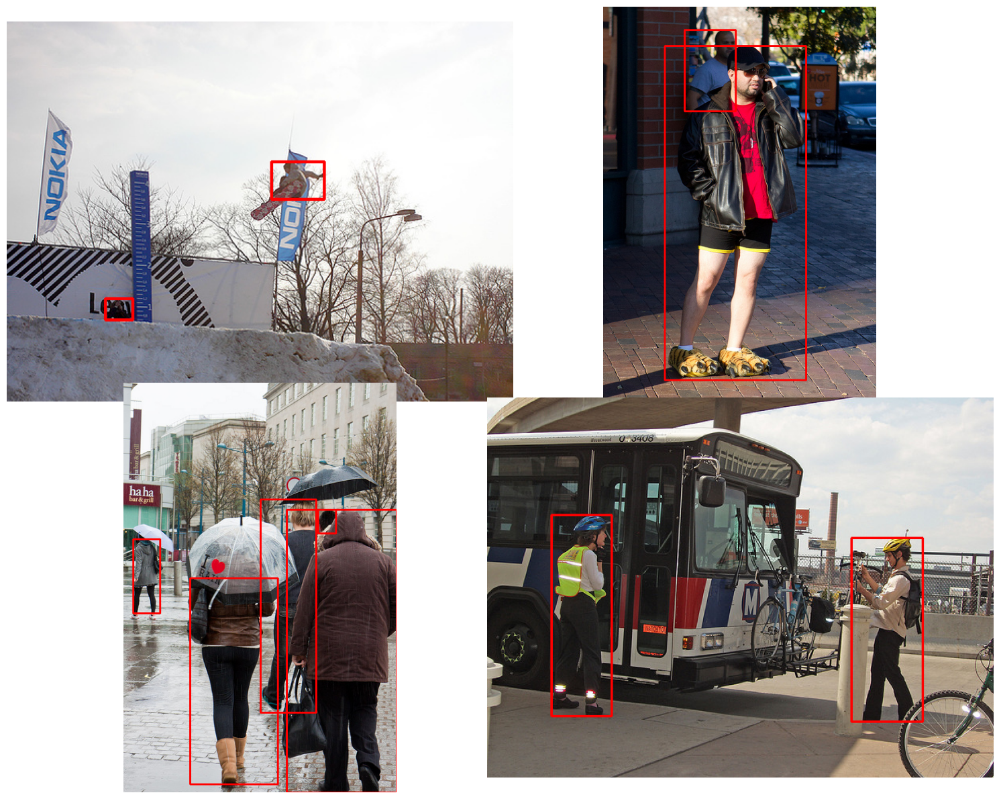

In [16]:
# Visualize a few training images.
plot(
    image_paths='datasets/coco-2017/images/train',
    label_paths='datasets/coco-2017/labels/train',
    num_samples=4
)

## Dataset YAML File

Path untuk training diatur melalui file yaml

In [ ]:
%%writefile coco_person_yolo.yaml
path: 'coco-2017/'
train: 'images/train'
val: 'images/val'

# class names
names:
  0: 'person'


## YOLO Training

In [21]:
##############################################################
# Tentukan di sini model dan parameter yg akan diuji
##############################################################
train_model = 'yolov8m.yaml'
pretrained_weight = 'yolov8m.pt'

EPOCHS = 50

###
# mengubah directory logging ke dalam colab agar hasilnya bisa permanen
# Untuk logging hasil terdapat perbedaan antara v5 dan v8 (https://github.com/ultralytics/ultralytics/issues/3527)
# untuk v8
project = '/content/drive/MyDrive/ai_ind_p2_logs'
experiment = 'yolov8_m_50e' # isian untuk parameter name. Sebagai subfolder dalam 'project'
# untuk v5
save_dir = '/content/drive/MyDrive/ai_ind_p2_logs/yolov5'
##############################################################

train_data = 'coco_person_yolo.yaml'

In [22]:
# Logging
os.makedirs(project, exist_ok=True) # v8
# os.makedirs(save_dir, exist_ok=True) # v5

In [23]:
# build from YAML and transfer weights
model = YOLO(train_model).load(pretrained_weight)

results = model.train(
    data=train_data,
    epochs=EPOCHS,
    imgsz=640,
    project=project, # v8
    name=experiment, # v8
    # save_dir=save_dir, # v5
)


                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics.nn.modules.conv.Conv             [384

100%|██████████| 49.7M/49.7M [00:00<00:00, 303MB/s]


Transferred 475/475 items from pretrained weights
Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
engine/trainer: task=detect, mode=train, model=yolov8m.yaml, data=coco_person_yolo.yaml, epochs=50, patience=50, batch=16, imgsz=640, save=True, save_period=-1, cache=False, device=None, workers=8, project=/content/drive/MyDrive/ai_ind_p2_logs, name=yolov8_m_50e, exist_ok=False, pretrained=True, optimizer=auto, verbose=True, seed=0, deterministic=True, single_cls=False, rect=False, cos_lr=False, close_mosaic=10, resume=False, amp=True, fraction=1.0, profile=False, freeze=None, overlap_mask=True, mask_ratio=4, dropout=0.0, val=True, split=val, save_json=False, save_hybrid=False, conf=None, iou=0.7, max_det=300, half=False, dnn=False, plots=True, source=None, vid_stride=1, stream_buffer=False, visualize=False, augment=False, agnostic_nms=False, classes=None, retina_masks=False, show=False, save_frames=False, save_txt=False, save_conf=False, save_crop=F

100%|██████████| 755k/755k [00:00<00:00, 64.3MB/s]


Overriding model.yaml nc=80 with nc=1

                   from  n    params  module                                       arguments                     
  0                  -1  1      1392  ultralytics.nn.modules.conv.Conv             [3, 48, 3, 2]                 
  1                  -1  1     41664  ultralytics.nn.modules.conv.Conv             [48, 96, 3, 2]                
  2                  -1  2    111360  ultralytics.nn.modules.block.C2f             [96, 96, 2, True]             
  3                  -1  1    166272  ultralytics.nn.modules.conv.Conv             [96, 192, 3, 2]               
  4                  -1  4    813312  ultralytics.nn.modules.block.C2f             [192, 192, 4, True]           
  5                  -1  1    664320  ultralytics.nn.modules.conv.Conv             [192, 384, 3, 2]              
  6                  -1  4   3248640  ultralytics.nn.modules.block.C2f             [384, 384, 4, True]           
  7                  -1  1   1991808  ultralytics

100%|██████████| 6.23M/6.23M [00:00<00:00, 272MB/s]


AMP: checks passed ✅


train: Scanning /content/datasets/coco-2017/labels/train... 3000 images, 0 backgrounds, 0 corrupt: 100%|██████████| 3000/3000 [00:01<00:00, 2042.98it/s]


train: New cache created: /content/datasets/coco-2017/labels/train.cache
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))


val: Scanning /content/datasets/coco-2017/labels/val... 500 images, 0 backgrounds, 0 corrupt: 100%|██████████| 500/500 [00:00<00:00, 1589.84it/s]

val: New cache created: /content/datasets/coco-2017/labels/val.cache


Plotting labels to /content/drive/MyDrive/ai_ind_p2_logs/yolov8_m_50e/labels.jpg... 
optimizer: 'optimizer=auto' found, ignoring 'lr0=0.01' and 'momentum=0.937' and determining best 'optimizer', 'lr0' and 'momentum' automatically... 
optimizer: AdamW(lr=0.002, momentum=0.9) with parameter groups 77 weight(decay=0.0), 84 weight(decay=0.0005), 83 bias(decay=0.0)
Image sizes 640 train, 640 val
Using 2 dataloader workers
Logging results to /content/drive/MyDrive/ai_ind_p2_logs/yolov8_m_50e
Starting training for 50 epochs...

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       1/50      6.91G       1.31      1.334      1.372         78        640: 100%|██████████| 188/188 [01:52<00:00,  1.68it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:11<00:00,  1.35it/s]

                   all        500       2090      0.309      0.337      0.246      0.119



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       2/50         7G      1.704      1.783       1.66         47        640: 100%|██████████| 188/188 [01:46<00:00,  1.77it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.62it/s]

                   all        500       2090      0.364      0.394      0.311      0.138



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       3/50      7.05G        1.7      1.746      1.655         73        640: 100%|██████████| 188/188 [01:44<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.94it/s]


                   all        500       2090      0.494      0.414      0.401      0.197

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       4/50      7.04G      1.663      1.733      1.638         22        640: 100%|██████████| 188/188 [01:44<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.19it/s]

                   all        500       2090      0.488      0.419      0.414      0.202



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       5/50      7.02G      1.584      1.622      1.575         68        640: 100%|██████████| 188/188 [01:45<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.43it/s]

                   all        500       2090      0.576       0.47       0.49      0.262



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       6/50      6.99G      1.533      1.564      1.545         60        640: 100%|██████████| 188/188 [01:45<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.29it/s]

                   all        500       2090      0.563      0.484      0.497      0.273



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       7/50      7.11G      1.483      1.477      1.517         84        640: 100%|██████████| 188/188 [01:45<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.26it/s]

                   all        500       2090      0.618      0.482       0.52      0.292



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       8/50      7.12G      1.463      1.447      1.496         61        640: 100%|██████████| 188/188 [01:45<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.05it/s]

                   all        500       2090      0.612      0.504      0.552       0.32



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


       9/50      7.01G      1.424      1.419      1.475         57        640: 100%|██████████| 188/188 [01:45<00:00,  1.78it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.40it/s]

                   all        500       2090      0.618      0.508      0.547      0.323



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      10/50         7G      1.406      1.391      1.461         63        640: 100%|██████████| 188/188 [01:44<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.30it/s]

                   all        500       2090      0.623       0.55      0.583      0.341



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      11/50      7.03G      1.391      1.362      1.454         48        640: 100%|██████████| 188/188 [01:44<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.47it/s]

                   all        500       2090      0.698      0.513      0.588      0.336



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      12/50      7.01G      1.376      1.345      1.438         50        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.84it/s]

                   all        500       2090      0.648      0.565      0.604      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      13/50         7G      1.343      1.292      1.418         41        640: 100%|██████████| 188/188 [01:43<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.86it/s]

                   all        500       2090      0.667      0.535      0.598      0.357



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      14/50      7.01G      1.317      1.254      1.402         63        640: 100%|██████████| 188/188 [01:42<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.18it/s]

                   all        500       2090      0.643      0.561      0.608      0.367



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      15/50      7.01G      1.301       1.23      1.388         41        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.45it/s]

                   all        500       2090      0.684      0.545      0.614       0.36



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      16/50      7.12G      1.288      1.227      1.381         59        640: 100%|██████████| 188/188 [01:42<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.40it/s]

                   all        500       2090      0.667      0.547       0.61      0.375



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      17/50      7.01G       1.28      1.207       1.37         45        640: 100%|██████████| 188/188 [01:42<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.09it/s]

                   all        500       2090      0.678      0.584      0.645      0.391



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      18/50      6.99G      1.274      1.176      1.365         73        640: 100%|██████████| 188/188 [01:42<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.80it/s]

                   all        500       2090      0.691       0.59      0.654      0.402



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      19/50         7G       1.24      1.151      1.348         42        640: 100%|██████████| 188/188 [01:42<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.33it/s]

                   all        500       2090      0.715       0.56      0.645      0.404



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      20/50      7.03G      1.226       1.13      1.345         45        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all        500       2090        0.7      0.585      0.655       0.41



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      21/50         7G      1.202       1.11      1.325         56        640: 100%|██████████| 188/188 [01:43<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.83it/s]

                   all        500       2090      0.672      0.591      0.642      0.396



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      22/50      7.12G      1.195      1.086      1.313         83        640: 100%|██████████| 188/188 [01:43<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.83it/s]

                   all        500       2090      0.724      0.612      0.679      0.426



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      23/50      7.01G      1.191      1.084      1.315         50        640: 100%|██████████| 188/188 [01:45<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.29it/s]

                   all        500       2090      0.739      0.572      0.666      0.419



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      24/50      7.01G      1.166      1.056      1.299         53        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.06it/s]

                   all        500       2090      0.716      0.597      0.673      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      25/50      7.02G      1.161      1.057      1.298         50        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.99it/s]

                   all        500       2090      0.746      0.588      0.679      0.424



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      26/50      7.01G      1.155       1.03      1.297         73        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.86it/s]

                   all        500       2090      0.745      0.585      0.668      0.429



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      27/50      6.99G      1.149      1.015      1.294         64        640: 100%|██████████| 188/188 [01:43<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.06it/s]

                   all        500       2090      0.728      0.619      0.694      0.439



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      28/50         7G      1.128     0.9945      1.275         56        640: 100%|██████████| 188/188 [01:43<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.40it/s]

                   all        500       2090      0.713      0.608      0.686      0.437



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      29/50      7.02G      1.122     0.9829      1.278         39        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.46it/s]

                   all        500       2090      0.708       0.61      0.672      0.434



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      30/50      7.01G       1.11     0.9881      1.267         40        640: 100%|██████████| 188/188 [01:42<00:00,  1.84it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.14it/s]

                   all        500       2090      0.732      0.586      0.671      0.432



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      31/50         7G      1.109     0.9661      1.258         91        640: 100%|██████████| 188/188 [01:42<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  2.00it/s]

                   all        500       2090      0.745      0.611      0.691      0.452



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      32/50      7.12G      1.089     0.9335      1.242         63        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.03it/s]

                   all        500       2090      0.764       0.61      0.705      0.455



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      33/50       7.1G      1.071     0.9223       1.24         66        640: 100%|██████████| 188/188 [01:44<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.15it/s]

                   all        500       2090      0.763      0.617      0.701      0.457



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      34/50      7.03G      1.066     0.9163      1.231         60        640: 100%|██████████| 188/188 [01:43<00:00,  1.81it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.24it/s]

                   all        500       2090      0.748      0.605      0.695      0.447



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      35/50      6.99G      1.057     0.9008       1.23         59        640: 100%|██████████| 188/188 [01:42<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.12it/s]

                   all        500       2090      0.734       0.63      0.705      0.456



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      36/50       7.1G      1.046     0.8978      1.227         72        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.24it/s]

                   all        500       2090      0.762      0.611      0.705      0.454



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      37/50      7.09G      1.041     0.8777      1.214         55        640: 100%|██████████| 188/188 [01:43<00:00,  1.82it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.42it/s]

                   all        500       2090       0.76      0.617      0.704      0.465



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      38/50      7.04G      1.019     0.8675      1.204         50        640: 100%|██████████| 188/188 [01:44<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.19it/s]

                   all        500       2090      0.746      0.628      0.709      0.466



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      39/50      7.13G      1.013     0.8464      1.205         80        640: 100%|██████████| 188/188 [01:44<00:00,  1.80it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.73it/s]

                   all        500       2090      0.737      0.634       0.71      0.468



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      40/50      7.13G      1.009     0.8242      1.191         32        640: 100%|██████████| 188/188 [01:44<00:00,  1.79it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:09<00:00,  1.76it/s]

                   all        500       2090      0.777       0.62      0.713      0.466


Closing dataloader mosaic
albumentations: Blur(p=0.01, blur_limit=(3, 7)), MedianBlur(p=0.01, blur_limit=(3, 7)), ToGray(p=0.01), CLAHE(p=0.01, clip_limit=(1, 4.0), tile_grid_size=(8, 8))

      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      41/50      7.13G     0.9782     0.7739      1.166         28        640: 100%|██████████| 188/188 [01:42<00:00,  1.83it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.79it/s]

                   all        500       2090      0.725       0.65      0.714      0.467



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      42/50      7.13G     0.9627     0.7384      1.149         39        640: 100%|██████████| 188/188 [01:41<00:00,  1.86it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.15it/s]

                   all        500       2090      0.729      0.649      0.716      0.472



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      43/50      7.12G     0.9425     0.7191      1.137         28        640: 100%|██████████| 188/188 [01:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.18it/s]

                   all        500       2090      0.773      0.627       0.72      0.464



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      44/50      7.13G     0.9282     0.6933      1.125         54        640: 100%|██████████| 188/188 [01:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:06<00:00,  2.47it/s]

                   all        500       2090      0.775      0.616      0.717      0.469



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      45/50      7.13G     0.9172     0.6871       1.12         56        640: 100%|██████████| 188/188 [01:40<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.81it/s]

                   all        500       2090      0.776       0.63      0.722      0.471



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      46/50      7.13G     0.9057     0.6714      1.114         17        640: 100%|██████████| 188/188 [01:39<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.01it/s]

                   all        500       2090       0.75      0.647      0.727      0.476



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      47/50      7.12G     0.8911     0.6512      1.103         57        640: 100%|██████████| 188/188 [01:39<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:07<00:00,  2.06it/s]

                   all        500       2090      0.744      0.656      0.726      0.478



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      48/50      7.13G     0.8869     0.6433      1.096         44        640: 100%|██████████| 188/188 [01:40<00:00,  1.87it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.78it/s]

                   all        500       2090      0.757      0.651      0.729      0.482



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      49/50      7.12G     0.8792     0.6322      1.092         21        640: 100%|██████████| 188/188 [01:39<00:00,  1.88it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.78it/s]

                   all        500       2090      0.734      0.664      0.727      0.481



      Epoch    GPU_mem   box_loss   cls_loss   dfl_loss  Instances       Size


      50/50      7.13G     0.8664     0.6146      1.083         19        640: 100%|██████████| 188/188 [01:39<00:00,  1.89it/s]
                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:08<00:00,  1.92it/s]

                   all        500       2090      0.782      0.633      0.727       0.48



50 epochs completed in 1.618 hours.
Optimizer stripped from /content/drive/MyDrive/ai_ind_p2_logs/yolov8_m_50e/weights/last.pt, 52.0MB
Optimizer stripped from /content/drive/MyDrive/ai_ind_p2_logs/yolov8_m_50e/weights/best.pt, 52.0MB

Validating /content/drive/MyDrive/ai_ind_p2_logs/yolov8_m_50e/weights/best.pt...
Ultralytics YOLOv8.0.221 🚀 Python-3.10.12 torch-2.1.0+cu118 CUDA:0 (Tesla T4, 15102MiB)
YOLOv8m summary (fused): 218 layers, 25840339 parameters, 0 gradients, 78.7 GFLOPs


                 Class     Images  Instances      Box(P          R      mAP50  mAP50-95): 100%|██████████| 16/16 [00:14<00:00,  1.14it/s]


                   all        500       2090      0.755      0.651      0.729      0.482
Speed: 0.3ms preprocess, 7.2ms inference, 0.0ms loss, 3.0ms postprocess per image
Results saved to /content/drive/MyDrive/ai_ind_p2_logs/yolov8_m_50e


In [28]:
%load_ext tensorboard
%tensorboard --logdir .

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 37390), started 0:05:34 ago. (Use '!kill 37390' to kill it.)

<IPython.core.display.Javascript object>

## Predict

In [ ]:
# !ls /content/drive/MyDrive/ai_ind_p2_logs/

In [31]:
##############################################################
# Gunakan data logging terakhir
# Bisa dilihat pada bagian: Logging results to /content/drive/MyDrive/ai_ind_p2_logs/...
##############################################################

weight_result_path = '/content/drive/MyDrive/ai_ind_p2_logs/yolov8_m_50e/weights/best.pt'

In [32]:
model = YOLO(weight_result_path)


image 1/1 /content/datasets/coco-2017/images/train/000000000360.jpg: 480x640 1 person, 141.4ms
Speed: 5.0ms preprocess, 141.4ms inference, 5.9ms postprocess per image at shape (1, 3, 480, 640)


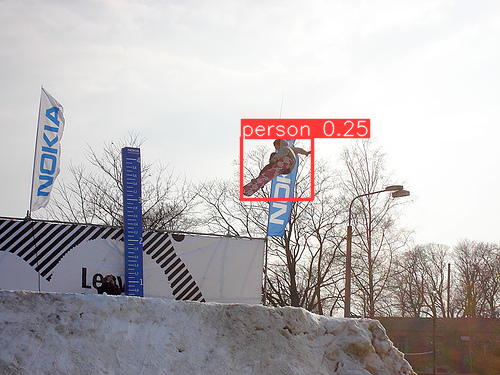

-1

In [33]:
# Predict local data (simulasi saja)
import cv2
from google.colab.patches import cv2_imshow

img_pth = '/content/datasets/coco-2017/images/train/000000000360.jpg'

results = model(source=img_pth)
res_plotted = results[0].plot()
cv2_imshow(res_plotted)
cv2.waitKey(0)

100%|██████████| 476k/476k [00:00<00:00, 60.4MB/s]

image 1/1 /content/bus.jpg: 640x480 4 persons, 67.0ms
Speed: 2.8ms preprocess, 67.0ms inference, 2.2ms postprocess per image at shape (1, 3, 640, 480)


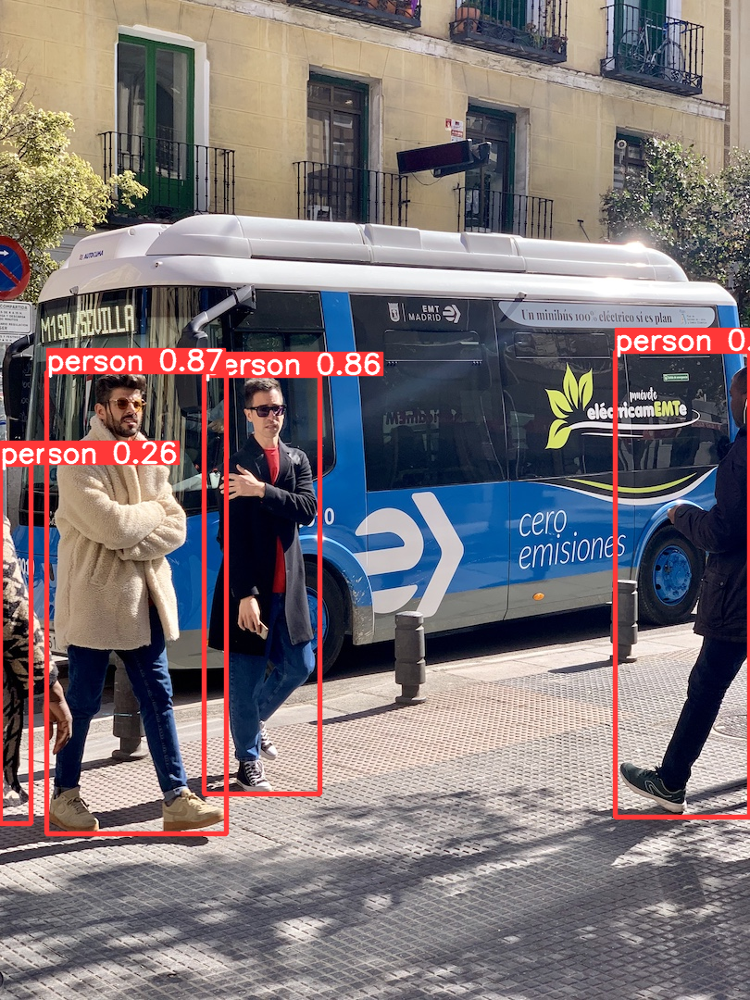

-1

In [34]:
# Predict online data
source = 'https://ultralytics.com/images/bus.jpg'
results = model(source)
res_plotted = results[0].plot()
cv2_imshow(res_plotted)
cv2.waitKey(0)

## ...and then, is he a Human or an Alien?

100%|██████████| 157k/157k [00:00<00:00, 22.7MB/s]

image 1/1 /content/Lionel-Messi-Argentina-2022-FIFA-World-Cup_(cropped).jpg: 640x480 1 person, 28.4ms
Speed: 2.3ms preprocess, 28.4ms inference, 2.8ms postprocess per image at shape (1, 3, 640, 480)


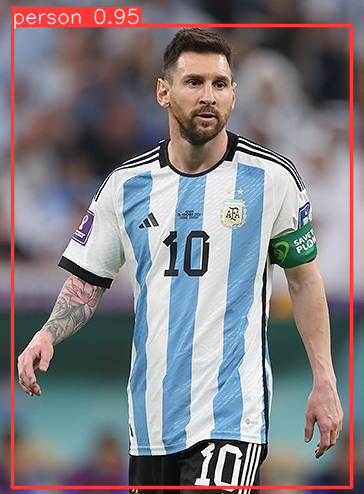

-1

In [35]:
source = 'https://upload.wikimedia.org/wikipedia/commons/b/b4/Lionel-Messi-Argentina-2022-FIFA-World-Cup_%28cropped%29.jpg'
results = model(source)
res_plotted = results[0].plot()
cv2_imshow(res_plotted)
cv2.waitKey(0)

oh, i see. 0.05% alien confirmed 😆😆😆

In [ ]:
'''
Tips: Untuk menghindari runtime timeout

1. Buka inspect pada Chrome
2. Klik tab console
3. Paste kode berikut:

function ClickConnect(){
console.log("Working");
document
  .querySelector('#top-toolbar > colab-connect-button')
  .shadowRoot.querySelector('#connect')
  .click()
}
setInterval(ClickConnect, 60000)

4. Tekan Enter.

NOTE: Dengan memakai cara ini akan ada kemungkinan terjadi tumpukan layer captcha (saat colab ditinggal terlalu lama).
Klik saja satu per satu hingga semuanya tertutup.
'''